In [20]:
import sys
sys.path.append(r"/mnt/ceph/users/tudomlumleart/00_VirtualEnvironments/teeu/lib/python3.10/site-packages")
sys.path.append(r"/mnt/home/tudomlumleart/.local/lib/python3.10/site-packages/")
sys.path.append(r"/mnt/home/tudomlumleart/ceph/00_VirtualEnvironments/jupyter-gpu/lib/python3.10/site-packages")
import jax.numpy as jnp
import jax
import numpyro

from numpyro import handlers
from numpyro.infer import MCMC, NUTS
import matplotlib.pyplot as plt
from functions import *
from utils import *

XLA_PYTHON_CLIENT_MEM_FRACTION=.25

jax.config.update("jax_debug_nans", True)

def logprior(dmap_flat, num_probes):
    """
    """
    return jnp.sum(jnp.array(logprior_(dmap_flat, num_probes)))

@partial(jax.jit, static_argnums=(1, ))
def logprior_(dmap_flat, num_probes):
    """
    """
    # Get 2D map back to simplify the expression 
    dmap = jnp.reshape(dmap_flat, [num_probes, num_probes])
    
    # Calculate the squared end-to-end distance 
    R_sq = dmap[0][-1] ** 2
    
    # Calculate the average bond length
    b = jnp.mean(jnp.diag(dmap, 1))
    
    N = num_probes
    
    # Calculate the probability
    scaling_factor = 1.5 * jnp.log(3/(2*np.pi*N*b**2))
    gaussian_term = -3*R_sq/(2*N*b**2)
    
    # print('Scaling factor = {}'.format(scaling_factor))
    # print('Gaussian term = {}'.format(gaussian_term))
    
    return scaling_factor, gaussian_term 

def gsm_helper(x, num_components, dimensions):
    # make sure the dimensions are correct
    # assert x.shape[0] == num_components * dimensions
    num_samples = x.shape[0]
    
    # # reshape the input
    # x = jnp.reshape(x, [num_components, dimensions])
    
    vmap_batch_lp = jax.vmap(log_posterior, in_axes=(0, None, None, None, None, None, None))
    
    # calculate the log posterior 
    # change this argument in real function 
    lp = jnp.sum(vmap_batch_lp(x, observation_flatten_list, true_weights, measurement_error, num_probes, num_components, dimensions))
    
    return lp

def log_posterior(metastructures, observations, metastructure_weights,
                  measurement_error, num_probes, num_components, dimensions):
    """
    Calculate the logarithm of the posterior probability distribution.

    Parameters
    ----------
    metastructures : 2-dimension array_like
        The metastructures representing the chromatin ensemble.
    observations : array_like
        The flattened observations.
    metastructure_weights : array_like
        The number of observations for each probe.
    measurement_error : float
        The measurement error.
    num_probes : int
        The number of probes.

    Returns
    -------
    float
        The logarithm of the posterior probability distribution.
    """
    metastructures = jnp.array(metastructures)
    # jax.debug.print("{x}", x=metastructures.shape)
    metastructures = jnp.reshape(metastructures, [num_components, dimensions])
    
    # Make sure metastructures, observations, and metastructure_weights are jnp arrays
    
    observations = jnp.array(observations)
    # jax.debug.print("{x}", x=observations.shape)
    metastructure_weights = jnp.array(metastructure_weights)
    metastructure_weights = jnp.reshape(metastructure_weights, [num_components, -1])
    jax.debug.print("{x}", x=metastructure_weights.sum())
    jax.debug.print("{x}", x=metastructure_weights)
    # make sure that metastructure_weights is > 0
    # metastructure_weights = jnp.abs(metastructure_weights)
    # metastructure_weights += jnp.finfo(jnp.float64).tiny
    
    # Set weight prior to be categorical distribution
    weight_prior = 1/len(metastructure_weights)
    
    # Calculate log posterior in batch using vmap
    vmap_batch_log_posterior = jit(jax.vmap(log_posterior_one_obs, in_axes=(None, 0, None, None, None, None)), static_argnums=(3, 4, 5))
    lp = vmap_batch_log_posterior(metastructures, observations, metastructure_weights, weight_prior, measurement_error, num_probes)
    # jax.debug.print("log prob = {x}, {y}", x=lp, y=metastructure_weights)
    log_posterior_total = jnp.sum(lp)
    
    return log_posterior_total

# Write a helper function to calculate the argument for logsumexp function for each metastructure
def _log_posterior_one_obs_helper(metastructure, observation, metastructure_weight, weight_prior,
                  measurement_error, num_probes):
    """_summary_

    Args:
        metastructures (_type_): _description_
        observations (_type_): _description_
        metastructure_weights (_type_): _description_
        measurement_error (_type_): _description_
        num_probes (_type_): _description_
        batch_size (_type_): _description_
    """
    # Calculate log weights 
    lw = jnp.log(metastructure_weight)
    
    # Calculate log likelihood
    lp = loglikelihood(observation, metastructure, measurement_error, num_probes)
    
    # Calculate log prior weights
    lpw = jnp.log(weight_prior)
    
    # Calculate log prior for metastructure
    lpm = logprior(metastructure, num_probes)
    
    # jax.debug.print("log prob = {x},\n log prior weight = {y},\n log prior metastructure = {z},\n log weights = {a}", x=lp, y=lpw, z=lpm, a=lw)
    
    return lw + lp + lpw + lpm

# Calculate the log posterior inside the logsumexp function
# Use vmap for autobatching 

def log_posterior_one_obs(metastructures, observation, metastructure_weights, weight_prior,
                  measurement_error, num_probes):
    """
    Calculate the logarithm of the posterior probability distribution.

    Parameters
    ----------
    metastructures : 2-dimension array_like
        The metastructures representing the chromatin ensemble.
    observations : array_like
        The flattened observations.
    metastructure_weights : array_like
        The number of observations for each probe.
    measurement_error : float
        The measurement error.
    num_probes : int
        The number of probes.

    Returns
    -------
    float
        The logarithm of the posterior probability distribution.
    """
    # Calculate the argument for logsumexp function 
    vmap_batch_lse_arg = jit(vmap(_log_posterior_one_obs_helper, (0, None, 0, None, None, None)), static_argnums=(3,4,5))
    lse_arg = vmap_batch_lse_arg(metastructures, observation, metastructure_weights, weight_prior, measurement_error, num_probes)
    
    # Calculate LSE
    lse = jax.scipy.special.logsumexp(lse_arg)
    
    return lse

def load_dataset(pickle_file):
    """
    Load the dataset from the pickle file.

    Parameters
    ----------
    pickle_file : str
        The path to the pickle file containing the dataset.

    Returns
    -------
    tuple
        A tuple of the observation list, the true labels, and a dictionary of parameters.

    Raises
    ------
    FileNotFoundError
        If the pickle file does not exist.

    Notes
    -----
    This function loads the dataset from a pickle file. The pickle file should contain a tuple
    with the observation list and the true labels. It also extracts parameters from the file name
    and puts them in a dictionary.

    Example
    -------
    >>> pickle_file = 'data.pickle'
    >>> observation_list, labels_true, param_dict = load_dataset(pickle_file)
    """
    with open(pickle_file, 'rb') as f:
        dataset_list = pickle.load(f)

        
    # Extract parameters from file name
    # Remove .pkl file suffix
    pickle_file = pickle_file.replace('.pkl', '')
    params = os.path.basename(pickle_file).split('_')[1:]
    params = [int(p) if p.isdigit() else float(p) for p in params]

    # Put the parameters in a dictionary
    param_dict = {
        'num_monomers': params[0],
        'mean_bond_length': params[1],
        'std_bond_length': params[2],
        'num_templates': params[3],
        'weights_dist': params[4],
        'noise_std': params[5],
        'num_observations': params[6]
    }
        
    return dataset_list, param_dict
    

In [40]:
# Load the data from the dataset 
dataset_dir = '/mnt/home/tudomlumleart/ceph/03_GaussianChainSimulation/20240627/dataset_100_10_20_2_1000_10.0_10000.pkl'

dataset_list, param_dict = load_dataset(dataset_dir)

num_observations = 10000
num_monomers = 100

# Sample the dataset according to num_observation
# Generate random indices that will randomly pickl num_observations from the list
indices = np.random.choice(len(dataset_list[0]['observation_list']), num_observations, replace=False)

template_list = dataset_list[0]['template_chain_list']
X = dataset_list[0]['observation_list'][indices]
label_list = dataset_list[0]['labels'][indices]

observation_flatten_list = [squareform(pdist(x[:num_monomers, :])).flatten() for x in X]

observations_flatten = [squareform(pdist(x)).flatten() for x in X]

# generate weight of each label from label_list
true_weights = np.array([np.sum(label_list == i) for i in np.unique(label_list)]) / len(label_list)
true_weights = true_weights.reshape(-1, 1)

In [41]:
param_dict

{'num_monomers': 100,
 'mean_bond_length': 10,
 'std_bond_length': 20,
 'num_templates': 2,
 'weights_dist': 1000,
 'noise_std': 10.0,
 'num_observations': 10000}

In [42]:
templates_flatten = [squareform(pdist(x[:num_monomers, :])).flatten() for x in template_list]

In [43]:
# Generate random walk for guessing structures
# num_monomers = param_dict['num_monomers']
num_monomers = 100
mean_bond_length = param_dict['mean_bond_length']
std_bond_length = param_dict['std_bond_length'] 
num_templates = param_dict['num_templates']
measurement_error = param_dict['noise_std']
num_probes = num_monomers
num_candidates = 2

candidate_polymer_list = [generate_gaussian_chain(num_monomers, mean_bond_length, std_bond_length) for _ in range(num_candidates)]
candidate_flatten_list = [squareform(pdist(x)).flatten() for x in candidate_polymer_list]

In [44]:
# Try projected gradients in both weight space and structure space
lp_structure = jit(lambda x: log_posterior(x, observation_flatten_list, true_weights, measurement_error, num_probes, num_candidates, num_monomers**2))
lp_weight = jit(lambda x: log_posterior(candidate_flatten_list, observation_flatten_list, x, measurement_error, num_probes, num_candidates, num_monomers**2))

In [45]:
import gsmvi
from gsmvi.gsm import GSM

In [46]:
D = 100
niter = 500
key = random.PRNGKey(99)

In [47]:
lp_weight_g = jit(grad(lp_weight, argnums=0))

In [48]:
gsm = GSM(D=D, lp=lp_weight, lp_g=lp_weight_g)
mean_fit, cov_fit = gsm.fit(key, batch_size=1)

Iteration 0 of 5000
[[ 0.29475605]
 [ 1.22554978]
 [ 0.70512367]
 [ 0.52253501]
 [-2.44156179]
 [-0.92299094]
 [ 0.19634268]
 [ 0.63889639]
 [ 0.81521559]
 [-1.41922816]
 [ 0.45491272]
 [-1.26681264]
 [-0.28845916]
 [-0.21323651]
 [-0.4923703 ]
 [-1.1541972 ]
 [-0.21034735]
 [ 1.1802717 ]
 [ 0.10589678]
 [ 0.12437793]
 [ 1.40841149]
 [ 0.76723268]
 [-1.07638156]
 [ 0.92379069]
 [-0.39190322]
 [-0.42753884]
 [ 0.24872046]
 [-0.60326915]
 [-0.90054211]
 [-0.42444436]
 [-0.72961745]
 [ 1.13086697]
 [-0.26837917]
 [-0.28627963]
 [-0.47897817]
 [ 0.95409268]
 [-0.08790584]
 [ 0.98704421]
 [ 2.53114156]
 [-1.27008531]
 [-1.28597248]
 [ 0.03524742]
 [ 0.08411448]
 [-0.5207988 ]
 [-0.76954806]
 [ 0.26670864]
 [ 0.07690767]
 [-0.17864199]
 [ 0.57415206]
 [-0.35636032]
 [-0.9951357 ]
 [-0.83912094]
 [ 0.97442352]
 [-0.17233413]
 [ 0.33431367]
 [-0.5918383 ]
 [ 0.92293708]
 [-1.29774529]
 [ 0.79313537]
 [ 0.2112639 ]
 [-0.96858201]
 [-0.80146502]
 [-0.87941527]
 [-1.58183838]
 [ 0.59719257]
 [ 0.

/mnt/ceph/users/tudomlumleart/00_VirtualEnvironments/teeu/lib/python3.10/site-packages/gsmvi/gsm.py:119: RuntimeWarning: covariance is not positive-semidefinite.
  samples = np.random.multivariate_normal(mean=mean, cov=cov, size=batch_size)


[[-3.68460813e+01]
 [ 2.77418426e+02]
 [ 9.31748200e+01]
 [ 9.06683426e+02]
 [-1.31206134e+03]
 [ 1.49997291e+02]
 [-6.06251326e+02]
 [-1.56819732e+02]
 [ 6.40809839e+02]
 [ 6.48412799e+02]
 [ 1.68185192e+02]
 [ 8.58487284e+01]
 [ 1.36686650e+01]
 [-1.07712675e+03]
 [ 6.18167542e+02]
 [-1.21568650e+03]
 [-3.22949710e+02]
 [ 1.23724084e+03]
 [-1.17682624e+03]
 [-6.57221557e+02]
 [ 4.89222234e+01]
 [-2.61156252e+01]
 [-2.01872748e+00]
 [ 2.97788309e+01]
 [-1.67151800e+02]
 [-8.54044714e+02]
 [-2.32666896e+02]
 [ 4.50202664e+02]
 [-3.27353427e+02]
 [ 7.78668028e+02]
 [-5.07770772e+02]
 [ 5.71280052e+02]
 [-2.43430621e+02]
 [ 1.28764729e+02]
 [ 1.32099191e+00]
 [-2.30578180e+02]
 [-4.47108781e+01]
 [ 1.01113917e+03]
 [ 4.44381627e+02]
 [-1.64608777e+02]
 [ 3.01235292e+02]
 [ 3.29173301e+02]
 [-9.42007827e+02]
 [-9.48193782e+02]
 [ 4.59598174e+01]
 [-1.04917796e+03]
 [ 1.81389401e+00]
 [ 2.85087526e+02]
 [ 7.29731499e+02]
 [-4.97256090e+02]
 [ 2.99114602e+02]
 [ 6.96891386e+02]
 [-1.7734777

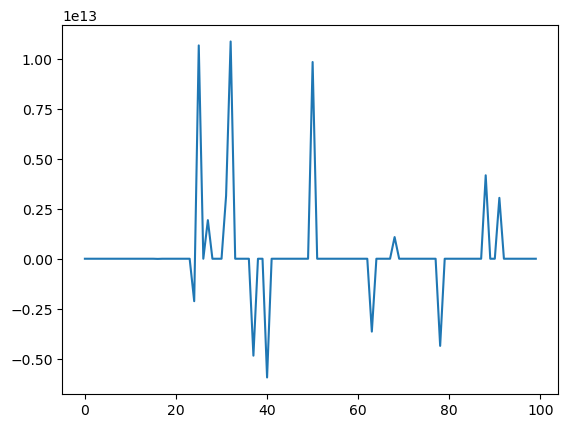

In [30]:
plt.plot(mean_fit)